In [91]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import numpy as np
import scanpy.external as sce

In [31]:
sc.settings.verbosity = 3  
# verbosity: errors (0), warnings (1), info (2), hints (3)
# sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80, facecolor='white', frameon=True, figsize=(5, 5))

In [26]:
samples_dict = {"CTR": "CTR", "AAV": "AAV"}

In [33]:
# the cell cyle gene extracted from seurat (cc.genes)
s_genes = list(pd.read_csv("./csv/s_genes.csv")["V2"])
g2m_genes = list(pd.read_csv("./csv/g2m_genes.csv")["V2"])
print(s_genes)
print(g2m_genes)

['Mcm5', 'Pcna', 'Tyms', 'Fen1', 'Mcm7', 'Mcm4', 'Rrm1', 'Ung', 'Gins2', 'Mcm6', 'Cdca7', 'Dtl', 'Prim1', 'Uhrf1', 'Cenpu', 'Hells', 'Rfc2', 'Polr1b', 'Nasp', 'Rad51ap1', 'Gmnn', 'Wdr76', 'Slbp', 'Ccne2', 'Ubr7', 'Pold3', 'Msh2', 'Atad2', 'Rad51', 'Rrm2', 'Cdc45', 'Cdc6', 'Exo1', 'Tipin', 'Dscc1', 'Blm', 'Casp8ap2', 'Usp1', 'Clspn', 'Pola1', 'Chaf1b', 'Mrpl36', 'E2f8']
['Hmgb2', 'Cdk1', 'Nusap1', 'Ube2c', 'Birc5', 'Tpx2', 'Top2a', 'Ndc80', 'Cks2', 'Nuf2', 'Cks1b', 'Mki67', 'Tmpo', 'Cenpf', 'Tacc3', 'Pimreg', 'Smc4', 'Ccnb2', 'Ckap2l', 'Ckap2', 'Aurkb', 'Bub1', 'Kif11', 'Anp32e', 'Tubb4b', 'Gtse1', 'Kif20b', 'Hjurp', 'Cdca3', 'Jpt1', 'Cdc20', 'Ttk', 'Cdc25c', 'Kif2c', 'Rangap1', 'Ncapd2', 'Dlgap5', 'Cdca2', 'Cdca8', 'Ect2', 'Kif23', 'Hmmr', 'Aurka', 'Psrc1', 'Anln', 'Lbr', 'Ckap5', 'Cenpe', 'Ctcf', 'Nek2', 'G2e3', 'Gas2l3', 'Cbx5', 'Cenpa']


In [34]:
adata_ovary_combined = sc.read_h5ad("pyobjs/slideseq_cell2loc_level1.h5ad")
adata_ovary_combined

AnnData object with n_obs × n_vars = 303411 × 16455
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Sample', '_indices', '_scvi_batch', '_scvi_labels', 'total_abundance', 'EN_Blood', 'EN_Lymph', 'Epithelium', 'GC_Antral', 'GC_Atretic', 'GC_CL_Active', 'GC_CL_Lytic', 'GC_Estrous', 'GC_Mitotic', 'GC_Mural', 'GC_Preantral', 'I_B_Cell', 'I_Dendritic_Cell', 'I_Granulocyte', 'I_Macrophage', 'I_T_Cell', 'M_Cortical Stroma', 'M_Dividing Mesenchyme', 'M_Immature Theca', 'M_Medullary Stroma', 'M_Pericyte', 'M_Smooth Muscle', 'M_Steroidogenic Theca', 'Oocyte', 'Level1_max_pred', 'Level1_max_pred_celltype'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts-AAV', 'mean_counts-AAV', 'log1p_mean_counts-AAV', 'pct_dropout_by_counts-AAV', 'total_counts-AAV', 'log1p_total_counts-AA

In [35]:
adata_ovary_combined.X.max()

582.0

In [36]:
adata_ovary_combined.obs["Level1_max_pred_celltype"].value_counts()

Level1_max_pred_celltype
M_Steroidogenic Theca    55770
GC_CL_Lytic              52082
EN_Blood                 36357
GC_Antral                30180
M_Smooth Muscle          23452
I_Macrophage             17832
GC_Mitotic               17406
M_Medullary Stroma       12089
Epithelium                9721
M_Pericyte                8877
EN_Lymph                  6375
GC_Preantral              6125
GC_Atretic                5530
M_Cortical Stroma         4699
M_Dividing Mesenchyme     4282
GC_Estrous                3511
M_Immature Theca          3154
Oocyte                    2918
I_T_Cell                  1035
GC_CL_Active               900
I_Dendritic_Cell           591
I_Granulocyte              319
I_B_Cell                   195
GC_Mural                    11
Name: count, dtype: int64

In [37]:
# # 创建一个空的字典来存储分开的数据
# adata_dict = {}

# # 根据样本中的 "CTR" 和 "AAV" 分别筛选数据
# adata_dict['CTR'] = adata_ovary_combined[adata_ovary_combined.obs['Sample'] == 'CTR']
# adata_dict['AAV'] = adata_ovary_combined[adata_ovary_combined.obs['Sample'] == 'AAV']
# adata_dict

{'CTR': View of AnnData object with n_obs × n_vars = 152894 × 16455
     obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Sample', '_indices', '_scvi_batch', '_scvi_labels', 'total_abundance', 'EN_Blood', 'EN_Lymph', 'Epithelium', 'GC_Antral', 'GC_Atretic', 'GC_CL_Active', 'GC_CL_Lytic', 'GC_Estrous', 'GC_Mitotic', 'GC_Mural', 'GC_Preantral', 'I_B_Cell', 'I_Dendritic_Cell', 'I_Granulocyte', 'I_Macrophage', 'I_T_Cell', 'M_Cortical Stroma', 'M_Dividing Mesenchyme', 'M_Immature Theca', 'M_Medullary Stroma', 'M_Pericyte', 'M_Smooth Muscle', 'M_Steroidogenic Theca', 'Oocyte', 'Level1_max_pred', 'Level1_max_pred_celltype'
     var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts-AAV', 'mean_counts-AAV', 'log1p_mean_counts-AAV', 'pct_dropout_by_counts-AAV', 'total_counts-AAV', 'log

In [42]:
granulosa_combined = adata_ovary_combined[
        adata_ovary_combined.obs["Level1_max_pred_celltype"].isin(["GC_CL_Lytic", "GC_Antral",
                                                                 "GC_Mitotic","GC_Preantral",
                                                                 "GC_Atretic","GC_CL_Active",
                                                                 "GC_Estrous"])
]
print(granulosa_combined.shape)

(115734, 16455)


In [ ]:
# 进行数据预处理和分析

sc.pp.normalize_total(granulosa_combined, inplace=True)
sc.pp.log1p(granulosa_combined)
sc.pp.highly_variable_genes(granulosa_combined, n_top_genes=3000)
sc.pl.highly_variable_genes(granulosa_combined)
sc.tl.score_genes_cell_cycle(granulosa_combined, s_genes=s_genes, g2m_genes=g2m_genes)

In [ ]:
sc.tl.rank_genes_groups(adata_ovary_combined_raw, groupby='Sample', method='wilcoxon')
# 查看结果，得到p值
result = adata_ovary_combined_raw.uns['rank_genes_groups']
groups = result['names'].dtype.names

# 打印每个对比组的前3个基因
for group in groups:
    print(f"Group {group}:")
    print("Gene names:", result['names'][group][:3])
    print("P-values:", result['pvals'][group][:3])
    
import pandas as pd
# 提取差异表达数据
def get_rank_genes_groups_df(adata, group):
    result = adata.uns['rank_genes_groups']
    return pd.DataFrame({
        'names': result['names'][group],
        'pvals': result['pvals'][group],
        'logfoldchanges': result['logfoldchanges'][group]
    })
    # 获取特定对比组的DataFrame

df = get_rank_genes_groups_df(adata_ovary_combined_raw, "AAV")

# 查找基因为 'Gpnmb' 或 'Enpp2' 的行
result = df[df['names'].isin(['Gpnmb', 'Enpp2',"Cxcl8",'Mmp12','Ptgs2','Cxcl8','Vegfa','Il6'])]

# 显示结果
print(result)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


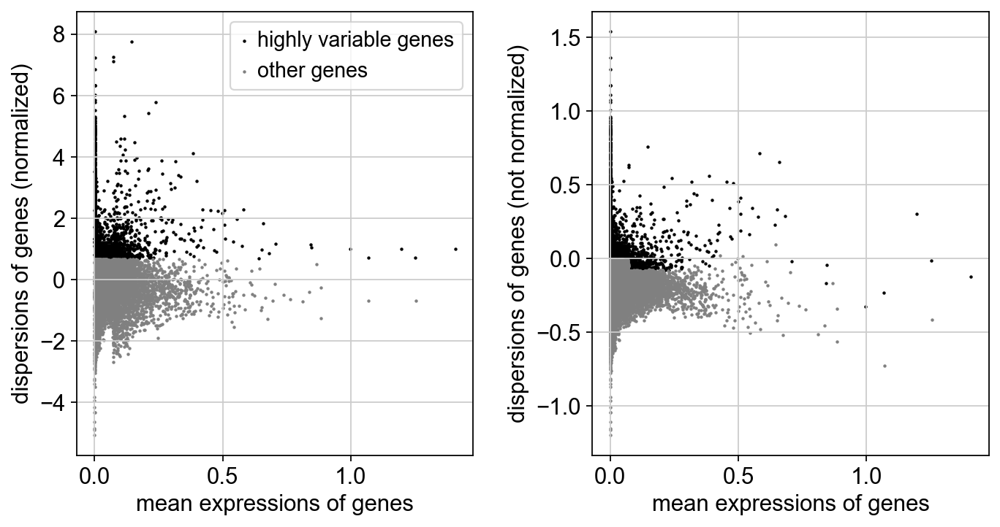

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    600 total control genes are used. (0:00:01)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    600 total control genes are used. (0:00:01)
-->     'phase', cell cycle phase (adata.obs)
(115734, 3000)
regressing out ['S_score', 'G2M_score', 'total_counts']


f:\anaconda\envs\omicverse\lib\site-packages\anndata\_core\anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


    sparse input is densified and may lead to high memory use
    finished (0:03:00)
computing PCA
    with n_comps=50
    finished (0:00:59)


In [44]:
granulosa_combined.raw = granulosa_combined
granulosa_combined = granulosa_combined[:, granulosa_combined.var.highly_variable]
print(granulosa_combined.shape)
sc.pp.regress_out(granulosa_combined, ['S_score', 'G2M_score', 'total_counts'])
# sc.pp.scale(combined_adata, max_value=10)
sc.pp.pca(granulosa_combined, random_state=0)

In [62]:
# harmony for batch remove
sce.pp.harmony_integrate(granulosa_combined, 'Sample')
# the pca_harmony replaced the position of the pca
sc.pp.neighbors(granulosa_combined, use_rep = "X_pca_harmony", n_pcs=50, key_added="harmony_nn")
sc.tl.umap(granulosa_combined, neighbors_key="harmony_nn")

2024-10-11 20:45:26,292 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-10-11 20:45:38,489 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-10-11 20:45:38,967 - harmonypy - INFO - Iteration 1 of 10
2024-10-11 20:46:11,694 - harmonypy - INFO - Iteration 2 of 10
2024-10-11 20:46:45,766 - harmonypy - INFO - Iteration 3 of 10
2024-10-11 20:47:16,908 - harmonypy - INFO - Iteration 4 of 10
2024-10-11 20:47:37,984 - harmonypy - INFO - Iteration 5 of 10
2024-10-11 20:48:01,443 - harmonypy - INFO - Iteration 6 of 10
2024-10-11 20:48:13,826 - harmonypy - INFO - Iteration 7 of 10
2024-10-11 20:48:26,106 - harmonypy - INFO - Iteration 8 of 10
2024-10-11 20:48:38,372 - harmonypy - INFO - Iteration 9 of 10
2024-10-11 20:48:52,272 - harmonypy - INFO - Converged after 9 iterations


computing neighbors
    finished: added to `.uns['harmony_nn']`
    `.obsp['harmony_nn_distances']`, distances for each pair of neighbors
    `.obsp['harmony_nn_connectivities']`, weighted adjacency matrix (0:00:15)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:08)


In [8]:
sc.tl.leiden(granulosa_combined, key_added="granulosa_leiden_1.0", neighbors_key="harmony_nn", resolution = 1.0)

C:\Users\zyy\AppData\Local\Temp\ipykernel_9152\4164983811.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(granulosa_combined, key_added="granulosa_leiden_1.0", neighbors_key="harmony_nn", resolution = 1.0)


In [11]:
print(granulosa_combined.shape)
sc.tl.rank_genes_groups(granulosa_combined, groupby="granulosa_leiden_1.0", key_added="markers_granulosa_leiden_1.0")

(115734, 3000)


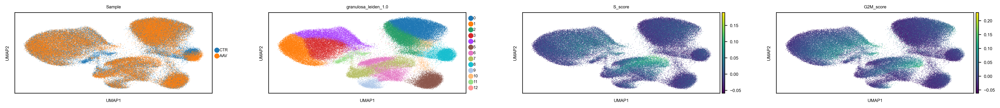

In [9]:
# 绘制UMAP图
sc.pl.umap(granulosa_combined, color=['Sample', 'granulosa_leiden_1.0','S_score', 'G2M_score'])

In [12]:
# granulosa_combined = granulosa_combined.write_h5ad("Integrate/granulosa_combined_before_annotation.h5ad")

In [14]:
granulosa_combined = sc.read_h5ad("Integrate/granulosa_combined_before_annotation.h5ad")

In [15]:
sc.settings.set_figure_params(dpi=80, facecolor='white', frameon=True, figsize=(4, 4))
# 创建一个空的字典来存储分开的数据
granulosa_dict = {}

# 根据样本中的 "CTR" 和 "AAV" 分别筛选数据
granulosa_dict['CTR'] = granulosa_combined[granulosa_combined.obs['Sample'] == 'CTR']
granulosa_dict['AAV'] = granulosa_combined[granulosa_combined.obs['Sample'] == 'AAV']


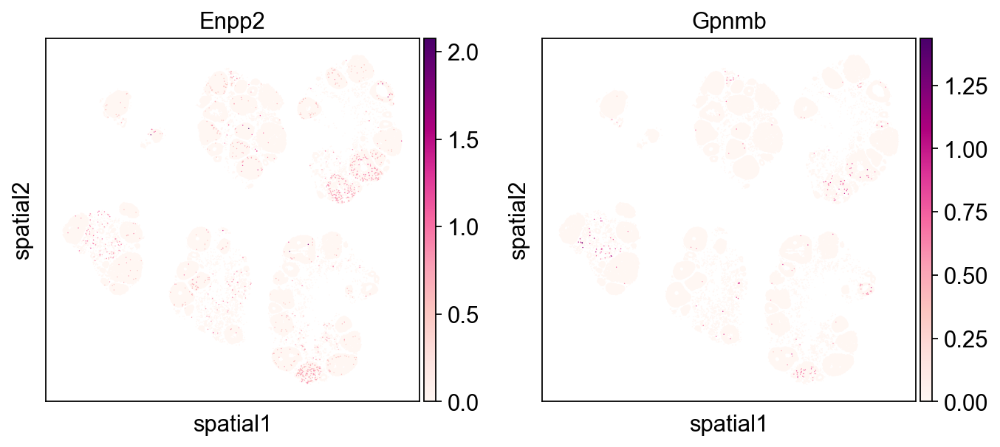

In [50]:
sc.pl.spatial(granulosa_dict["CTR"], color = ["Enpp2","Gpnmb"], spot_size=30,cmap="RdPu")

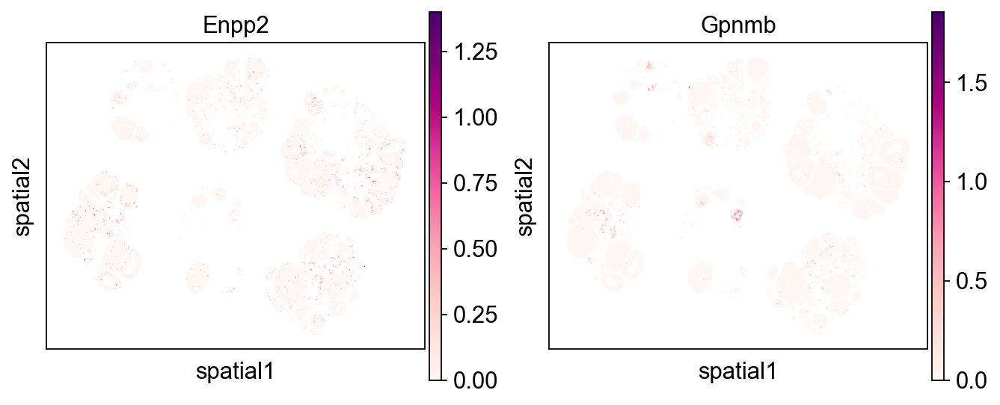

In [51]:
sc.pl.spatial(granulosa_dict["AAV"], color = ["Enpp2","Gpnmb"], spot_size=30,cmap="RdPu")

f:\anaconda\envs\omicverse\lib\site-packages\scanpy\tools\_dendrogram.py:193: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


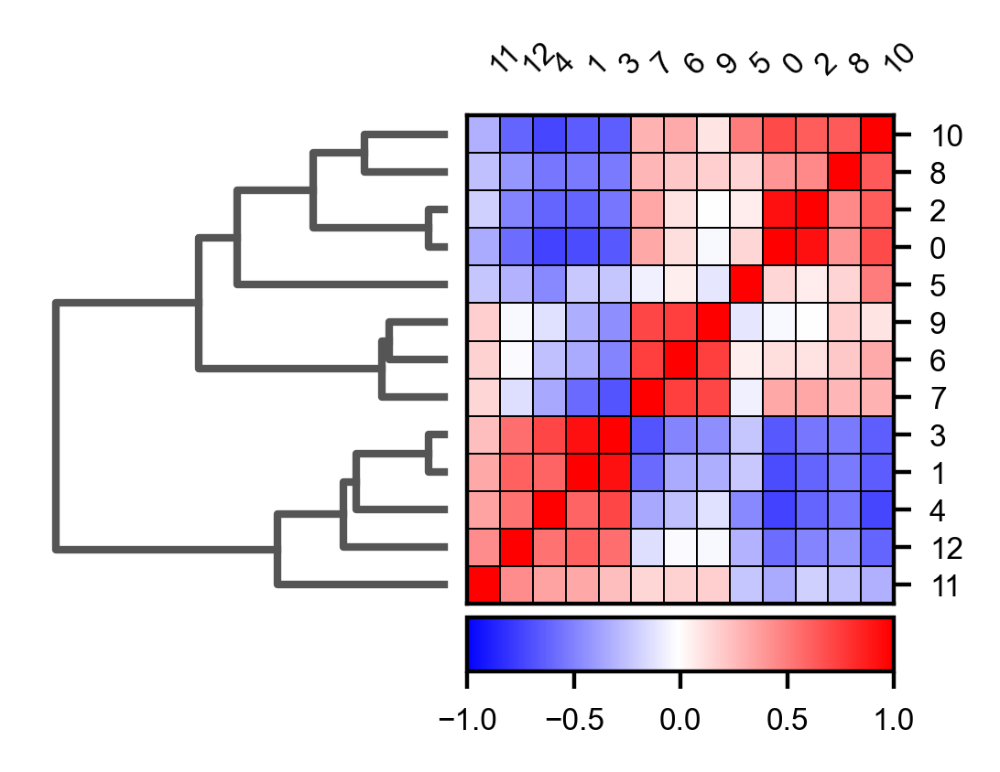

In [16]:
sample = "CTR"
sc.settings.set_figure_params(dpi=200, facecolor='white', fontsize=6, frameon=True, figsize=(5, 2))
ax = sc.pl.correlation_matrix(granulosa_dict[sample], 'granulosa_leiden_1.0', figsize=(3,2))

# 1. Annotation for CTR

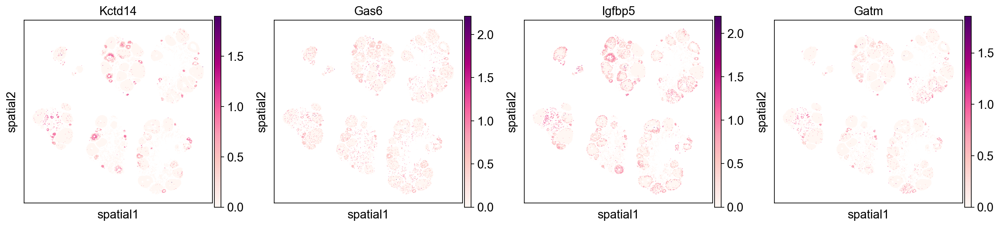

In [54]:
sc.settings.set_figure_params(dpi=80, facecolor='white', frameon=True, figsize=(4, 4))
# Preantral
sc.pl.spatial(granulosa_dict["CTR"], color = ["Kctd14","Gas6","Igfbp5","Gatm"], spot_size=30,cmap="RdPu")


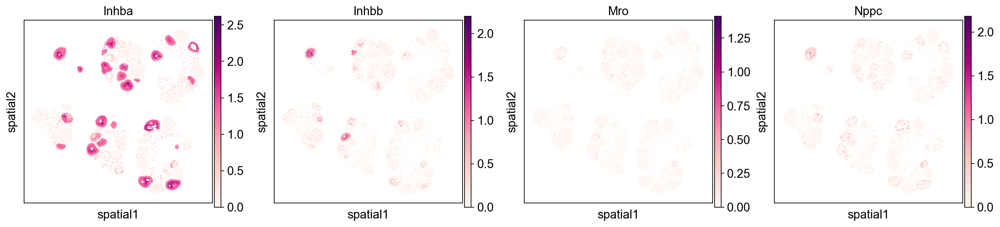

In [55]:
# Antral
sc.pl.spatial(granulosa_dict["CTR"], color = ["Inhba","Inhbb","Mro","Nppc"], spot_size=30,cmap="RdPu")

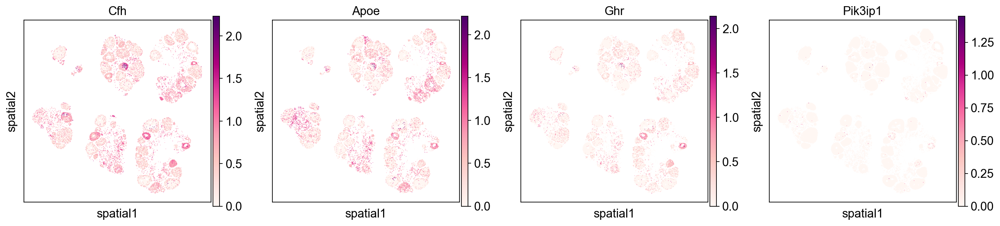

In [56]:
# Atretic
sc.pl.spatial(granulosa_dict["CTR"], color = ["Cfh","Apoe","Ghr","Pik3ip1"], spot_size=30,cmap="RdPu")

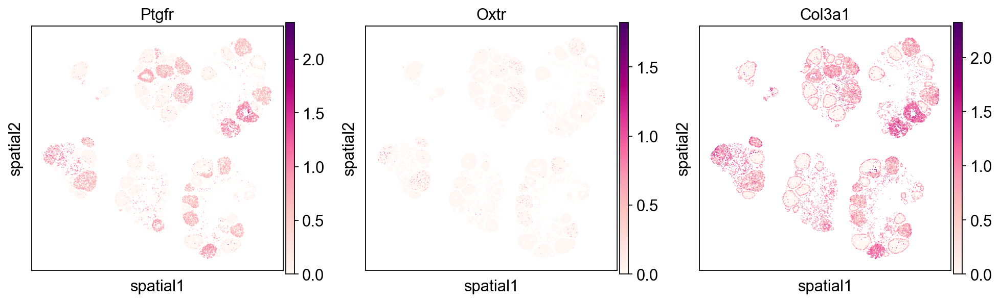

In [57]:
# Lytic
sc.pl.spatial(granulosa_dict["CTR"], color = ["Ptgfr","Oxtr","Col3a1"], spot_size=30,cmap="RdPu")

In [19]:
print(granulosa_dict["CTR"].obs["granulosa_leiden_1.0"].value_counts())

granulosa_leiden_1.0
0     11782
1      8403
2      7422
4      5713
3      5504
8      4790
5      4669
6      4109
7      4013
11     1546
9      1374
10     1057
12      179
Name: count, dtype: int64


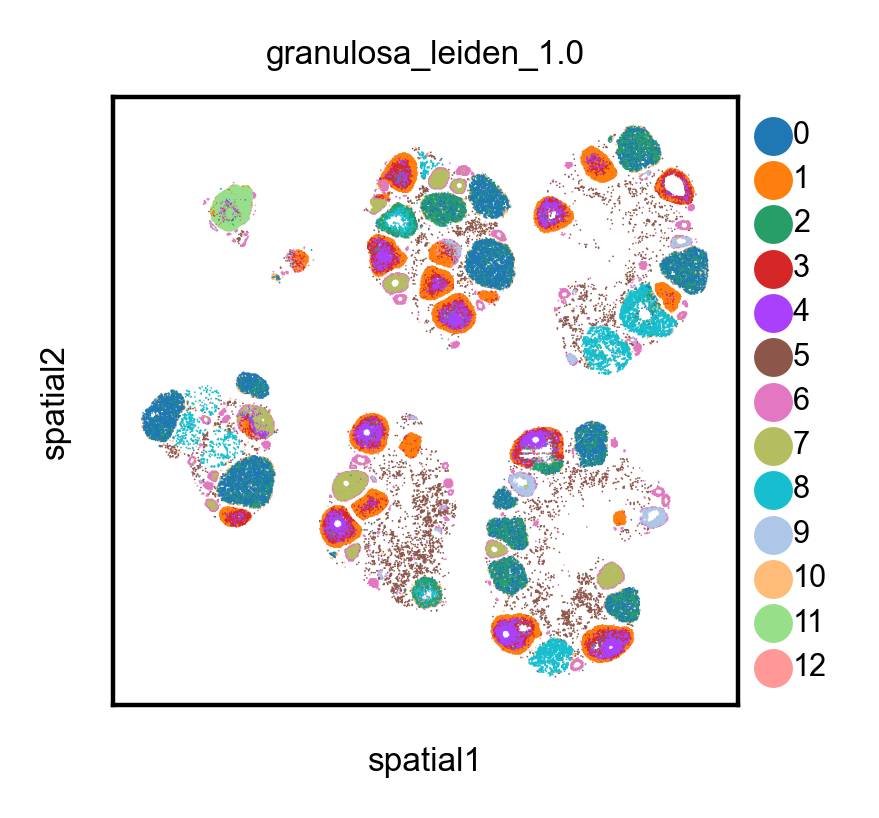

In [17]:
sc.pl.spatial(granulosa_dict["CTR"], color = "granulosa_leiden_1.0", spot_size=30)

In [50]:
sample = "CTR"
granulosa_dict[sample].obs["granulosa_clusters"] = granulosa_dict[sample].obs["granulosa_leiden_1.0"]
celltypes = {'0': "GC_Lytic", 
             '1': "GC_Antral", 
            '2': "GC_Lytic", 
            '3': "GC_Antral",
            '4': "GC_Antral",
            '5': "GC_Atretic",
            '6': "GC_Preantral",
            '7': "GC_Preantral",
            '8': "GC_Lytic",
            '9': "GC_Atretic", #
            '10': "Others",
            '11': "GC_Antral",
            "12":"Others"}
granulosa_dict[sample].obs["granulosa_celltypes"] = granulosa_dict[sample].obs["granulosa_clusters"].map(celltypes).astype("category")

# 2. AAV

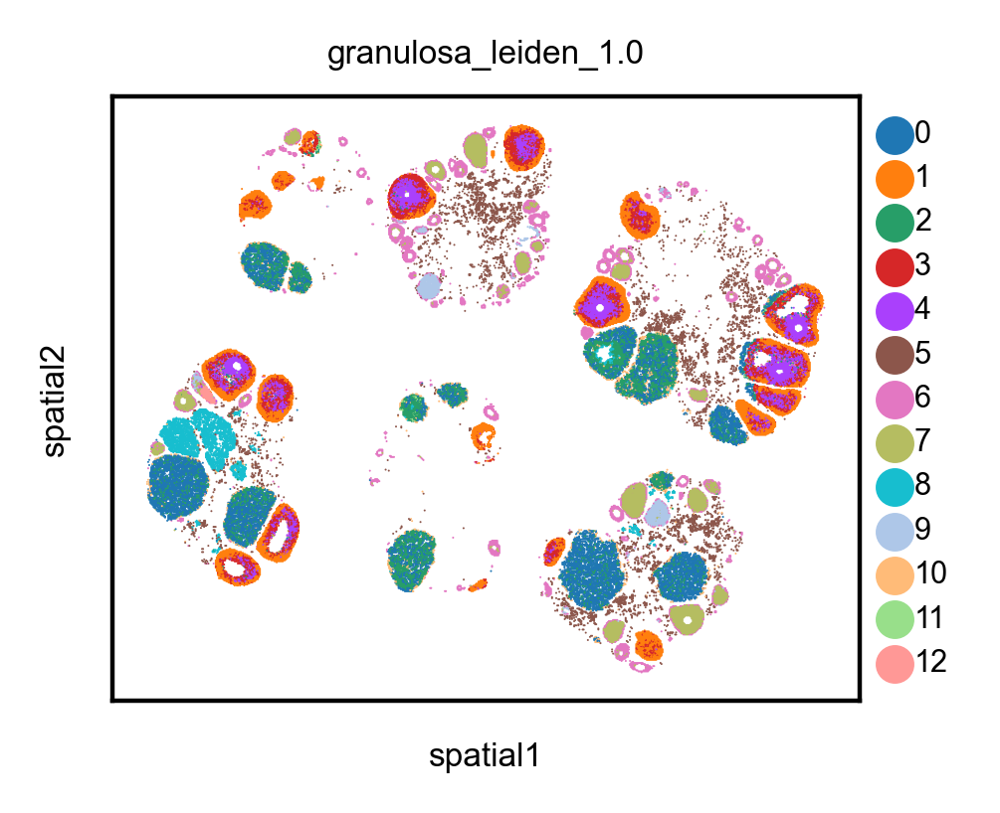

In [21]:
sc.pl.spatial(granulosa_dict["AAV"], color = "granulosa_leiden_1.0", spot_size=30)


In [51]:
sample = "AAV"
granulosa_dict[sample].obs["granulosa_clusters"] = granulosa_dict[sample].obs["granulosa_leiden_1.0"]
celltypes = {'0': "GC_Lytic", 
             '1': "GC_Antral", 
            '2': "GC_Lytic", 
            '3': "GC_Antral",
            '4': "GC_Antral",
            '5': "GC_Atretic",
            '6': "GC_Preantral",
            '7': "GC_Preantral",
            '8': "GC_Lytic",
            '9': "GC_Atretic", #
            '10': "Others",
            '11': "GC_Antral",
            "12":"Others"}
granulosa_dict[sample].obs["granulosa_celltypes"] = granulosa_dict[sample].obs["granulosa_clusters"].map(celltypes).astype("category")

In [52]:
for sample in granulosa_dict.keys():
        print(granulosa_dict[sample].shape)
        granulosa_dict[sample].write_h5ad("./pyobjs/granulosa_adata_"+ sample + "_with_image_processed_undertissue_filtered_reprocessed_integrated_individual_reprocessed_newscaling.h5ad")        

(60561, 3000)
(55173, 3000)


In [92]:
granulosa_dict = dict()
for sample in samples_dict.keys():
        granulosa_dict[sample] = sc.read_h5ad("./pyobjs/granulosa_adata_"+ sample + "_with_image_processed_undertissue_filtered_reprocessed_integrated_individual_reprocessed_newscaling.h5ad")
        print(granulosa_dict[sample].shape)
        #  granulosa_dict[sample].uns['log1p']["base"] = None

(60561, 3000)
(55173, 3000)


In [95]:
granulosa_combined = granulosa_dict[list(samples_dict.keys())[0]].raw.to_adata().concatenate([granulosa_dict[x].raw.to_adata() for x in list(samples_dict.keys())[1:]], batch_categories=list(samples_dict.keys()))
granulosa_combined.obs_names = [x.split("-")[0] + "-" + x.split("-")[1] + "-" + x.split("-")[2] for x in granulosa_combined.obs_names]
granulosa_combined.obs_names

C:\Users\zyy\AppData\Local\Temp\ipykernel_9152\1313630877.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  granulosa_combined = granulosa_dict[list(samples_dict.keys())[0]].raw.to_adata().concatenate([granulosa_dict[x].raw.to_adata() for x in list(samples_dict.keys())[1:]], batch_categories=list(samples_dict.keys()))


Index(['s_008um_00301_00321-1-CTR', 's_008um_00593_00642-1-CTR',
       's_008um_00336_00497-1-CTR', 's_008um_00605_00343-1-CTR',
       's_008um_00284_00196-1-CTR', 's_008um_00521_00423-1-CTR',
       's_008um_00652_00672-1-CTR', 's_008um_00320_00191-1-CTR',
       's_008um_00516_00369-1-CTR', 's_008um_00563_00437-1-CTR',
       ...
       's_008um_00326_00145-1-AAV', 's_008um_00251_00307-1-AAV',
       's_008um_00243_00304-1-AAV', 's_008um_00357_00367-1-AAV',
       's_008um_00442_00717-1-AAV', 's_008um_00220_00652-1-AAV',
       's_008um_00226_00297-1-AAV', 's_008um_00548_00323-1-AAV',
       's_008um_00309_00193-1-AAV', 's_008um_00456_00755-1-AAV'],
      dtype='object', length=115734)

In [55]:
granulosa_combined.obs["granulosa_celltypes"].cat.categories

Index(['GC_Antral', 'GC_Atretic', 'GC_Lytic', 'GC_Preantral', 'Others'], dtype='object')

In [96]:
granulosa_combined.obs["granulosa_celltypes"] = granulosa_combined.obs["granulosa_celltypes"].astype("category")
# granulosa_combined.obs["granulosa_celltypes"].cat.reorder_categories(
#     new_categories = ['GC_Mural_Outer-(Antral)', 'GC_Mural_Inner-(Antral)', 'GC_Mural-(Small Antral)',
#                       'GC_Mural_Outer-(Atretic)', 'GC_Mural_Inner-(Atretic)', 
#                       'GC_Cumulus', 'GC_Lytic', 'GC_Mitotic-(Antral)',
#                        'GC_Mural-(Preantral)', 'Others', "Mixed"], inplace = True)


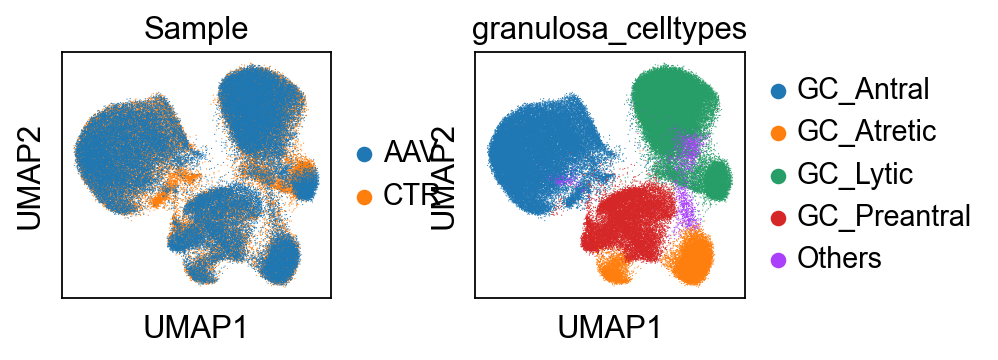

In [57]:
# 绘制UMAP图
sc.pl.umap(granulosa_combined, color=['Sample', 'granulosa_celltypes'])

In [26]:
# granulosa_combined.obs["granulosa_celltypes_reduced"] = granulosa_combined.obs["granulosa_celltypes"]
# celltypes = {'GC_Mural_Preantral': 'GC_Mural-(Preantral)',
#              'GC_Mural_Antral': "GC_Mural-(Antral)",
#              'GC_Mural_Inner_Antral': "GC_Mural-(Antral)",
#             'GC_Mural_Mixed_Lytic_Antral': "GC_Mural-(Antral)",
#              'GC_Mural_Outer_Antral': "GC_Mural-(Antral)",
#             'GC_Mural_Atretic': "GC_Mural-(Atretic)",
#             'GC_Mural_Lytic': 'GC_Mural-(Lytic)',
#             'Others': "Others"}
# granulosa_combined.obs["granulosa_celltypes_reduced"] = granulosa_combined.obs["granulosa_celltypes_reduced"].map(celltypes).astype("category")

In [27]:
# granulosa_combined.obs["granulosa_celltypes_reduced"] = granulosa_combined.obs["granulosa_celltypes_reduced"].astype("category")
# granulosa_combined.obs["granulosa_celltypes_reduced"].cat.reorder_categories(
#     new_categories = ['GC_Mural-(Preantral)',  'GC_Mural-(Antral)', 
#                       'GC_Mural-(Atretic)',  'GC_Mural-(Lytic)', "Others"], 
#     inplace = True)

C:\Users\zyy\AppData\Local\Temp\ipykernel_13008\481963076.py:2: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  granulosa_combined.obs["granulosa_celltypes_reduced"].cat.reorder_categories(


In [97]:
granulosa_combined.write_h5ad("./pyobjs/granulosa_individual_combined_newscaling.h5ad")

In [59]:
granulosa_combined = sc.read_h5ad("./pyobjs/granulosa_individual_combined_newscaling.h5ad")

f:\anaconda\envs\omicverse\lib\site-packages\anndata\_core\anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [98]:
granulosa_combined = granulosa_combined[~granulosa_combined.obs["granulosa_celltypes"].isin([ "Others"])]

In [61]:
sc.tl.rank_genes_groups(granulosa_combined, groupby="granulosa_celltypes", key_added="rank_gene_groups_granulosa_celltype", method="wilcoxon")

f:\anaconda\envs\omicverse\lib\site-packages\scanpy\tools\_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
f:\anaconda\envs\omicverse\lib\site-packages\anndata\_core\anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [62]:
sc.tl.dendrogram(granulosa_combined, groupby="granulosa_celltypes")

Original cmap N: 256
Custom palette length: 205
New cmap length: 205


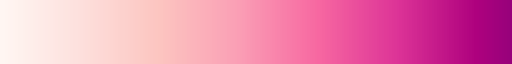

In [63]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm

# 获取原始cmap
cmap = cm.get_cmap('RdPu')

# 检查原始cmap中的颜色数量
print("Original cmap N:", cmap.N)

# 创建自定义调色板
palette_custom = [mcolors.rgb2hex(cmap(i)) for i in range(1,cmap.N - 50)]
print("Custom palette length:", len(palette_custom))

# 使用自定义调色板创建新的colormap
new_cmap = mcolors.ListedColormap(palette_custom)

# 检查新的colormap的长度
print("New cmap length:", len(new_cmap.colors))

new_cmap


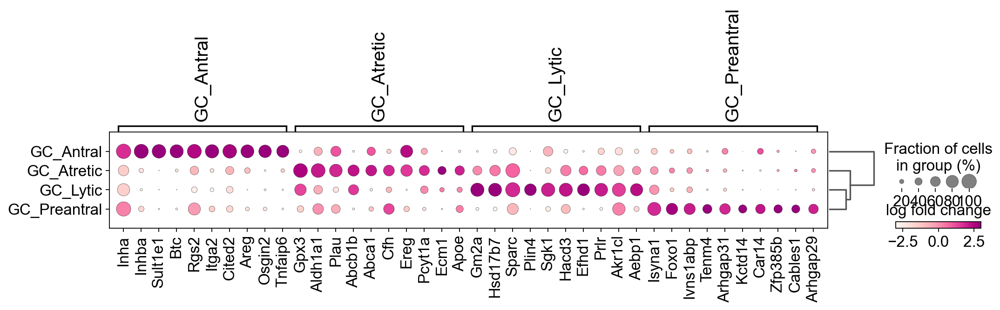

In [70]:
sc.settings.set_figure_params(dpi=80, fontsize=18, facecolor='white', frameon=True, figsize=(8, 5))
sc.pl.rank_genes_groups_dotplot(granulosa_combined, n_genes=10, key="rank_gene_groups_granulosa_celltype", 
                                values_to_plot='logfoldchanges', cmap=new_cmap, 
                                min_logfoldchange=1.5, vmin = -3.0, vmax = 3.0, figsize = (15,1.7), 
                                save="granulosa_subtype_markers_not_total")
sc.settings.set_figure_params(dpi=80, facecolor='white', frameon=True, figsize=(2, 2))

In [67]:
marker_list = list()
for group in granulosa_combined.uns['rank_gene_groups_granulosa_celltype']['names'].dtype.names:
    markers = sc.get.rank_genes_groups_df(granulosa_combined, key='rank_gene_groups_granulosa_celltype', group = group).head(50)
    markers["celltypes"] = group
    marker_list.append(markers)

In [68]:
marker_list

[       names      scores  logfoldchanges  pvals  pvals_adj  celltypes
 0       Inha  258.349640        1.767444    0.0        0.0  GC_Antral
 1      Inhba  253.883362        4.246644    0.0        0.0  GC_Antral
 2    Sult1e1  251.563629        6.607955    0.0        0.0  GC_Antral
 3        Btc  238.707382        5.395005    0.0        0.0  GC_Antral
 4       Rgs2  231.228470        2.490052    0.0        0.0  GC_Antral
 5      Itga2  230.731659        3.574915    0.0        0.0  GC_Antral
 6     Cited2  227.951141        2.748556    0.0        0.0  GC_Antral
 7       Areg  226.221100        4.307102    0.0        0.0  GC_Antral
 8     Osgin2  220.367447        4.506122    0.0        0.0  GC_Antral
 9    Tnfaip6  207.126846        4.391436    0.0        0.0  GC_Antral
 10  Serpine2  206.082916        2.510562    0.0        0.0  GC_Antral
 11      Bex4  205.857117        2.964051    0.0        0.0  GC_Antral
 12      Bmp3  204.126389        4.866743    0.0        0.0  GC_Antral
 13   

In [69]:
pd.concat(marker_list).to_csv("./csv/SuppTable1_granulosa_marker.csv", index=False)

atretic: #DB7BB8；
antral:#F8C6C4:
preantral:#F594BA
lytic: #F15536

In [99]:
colors = ['#F8C6C4',
            '#cb8e85', 
             '#f15536',
             # atretic
            '#F594BA',
            # immune
            
            ] # oocyte
# 添加颜色信息到adata.uns中
granulosa_combined.uns['granulosa_celltypes_colors'] = colors

C:\Users\zyy\AppData\Local\Temp\ipykernel_9152\2844687913.py:10: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  granulosa_combined.uns['granulosa_celltypes_colors'] = colors


In [89]:
granulosa_combined.uns['Sample_colors'] = ['#F29A9D','#DFDFDF']

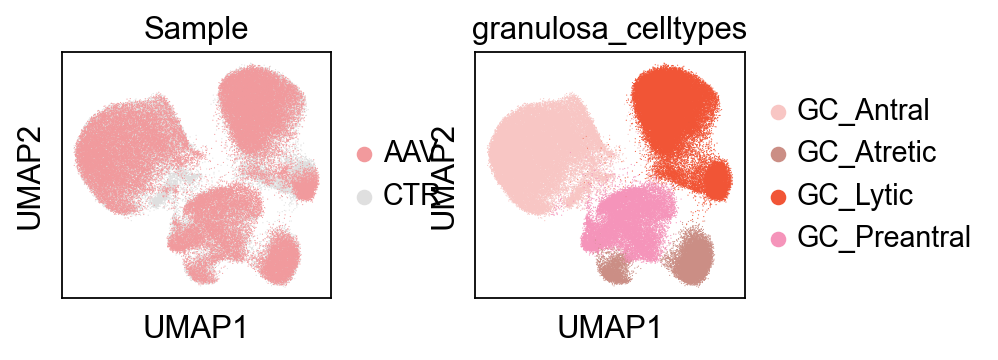

In [90]:
# 绘制UMAP图
sc.pl.umap(granulosa_combined, color=['Sample', 'granulosa_celltypes'],save='_granulosa_plot.pdf')

In [100]:
granulosa_combined.write_h5ad("Integrate/granulosa_pseudotime.h5ad")

In [40]:
cat_custom = [ 'GC_Mural-(Preantral)',  'GC_Mural-(Antral)', 
                      'GC_Mural-(Atretic)',  'GC_Mural-(Lytic)']

C:\Users\zyy\AppData\Local\Temp\ipykernel_13008\4168555325.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20')


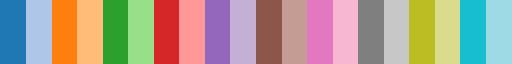

In [38]:
from pylab import *
cmap = cm.get_cmap('tab20')
palette_custom = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
cmap

C:\Users\zyy\AppData\Local\Temp\ipykernel_13008\1111105208.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(cat_custom)


Index(['GC_Mural-(Preantral)', 'GC_Mural-(Antral)', 'GC_Mural-(Atretic)',
       'GC_Mural-(Lytic)'],
      dtype='object')


C:\Users\zyy\AppData\Local\Temp\ipykernel_13008\1111105208.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(cat_custom)


Index(['GC_Mural-(Preantral)', 'GC_Mural-(Antral)', 'GC_Mural-(Atretic)',
       'GC_Mural-(Lytic)'],
      dtype='object')


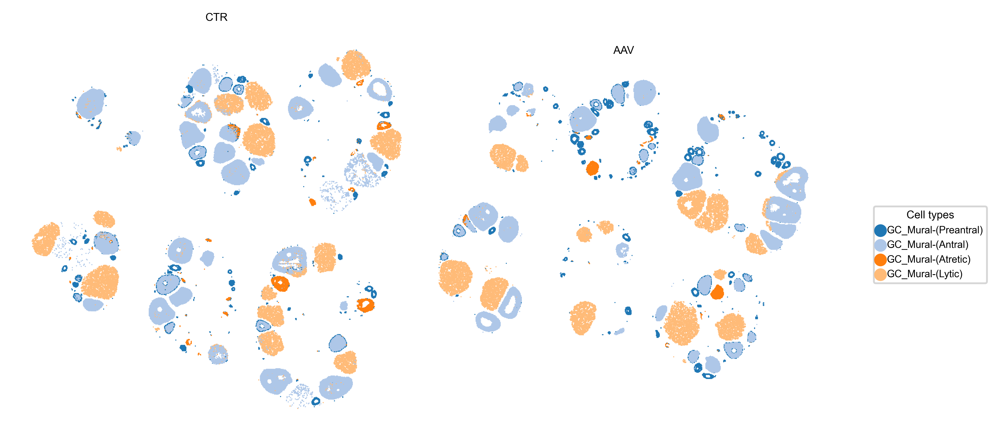

In [43]:
import matplotlib.pyplot as plt
import scanpy as sc

# Set figure parameters
sc.settings.set_figure_params(dpi=300, dpi_save=300, fontsize=6, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly=True, transparent=True, format="pdf")

grouping_var = "granulosa_celltypes_reduced"

# Create a figure with subplots arranged in a 1x2 grid
fig, axs = plt.subplots(1, 2, figsize=(8, 4))

# Loop through the samples to generate plots
for i, sample in enumerate(list(samples_dict.keys())[:2]):  # Limit to the first two samples
    subset = granulosa_combined[granulosa_combined.obs["Sample"] == sample]
    subset.obs[grouping_var] = subset.obs[grouping_var].cat.set_categories(cat_custom)
    print(subset.obs[grouping_var].cat.categories)
    
    # Plotting
    if i == 1:
        sc.pl.spatial(subset, color=[grouping_var], palette=palette_custom, wspace=0.0, hspace=0.0, spot_size=30, frameon=False, title=sample, show=False, ax=axs[i])
        handles, labels = axs[i].get_legend_handles_labels()
        axs[i].get_legend().remove()
    else:
        sc.pl.spatial(subset, color=[grouping_var], palette=palette_custom, wspace=0.0, hspace=0.0, spot_size=30, frameon=False, title=sample, show=False, legend_loc="none", ax=axs[i])

fig.legend(handles, labels, ncol=1, loc=6, bbox_to_anchor=(1.0, 0.5), title="Cell types")
plt.subplots_adjust(wspace=-0, hspace=0)


In [52]:
granulosa_combined.obs["granulosa_celltypes_reduced"].cat.categories

Index(['GC_Mural-(Preantral)', 'GC_Mural-(Antral)', 'GC_Mural-(Atretic)',
       'GC_Mural-(Lytic)'],
      dtype='object')

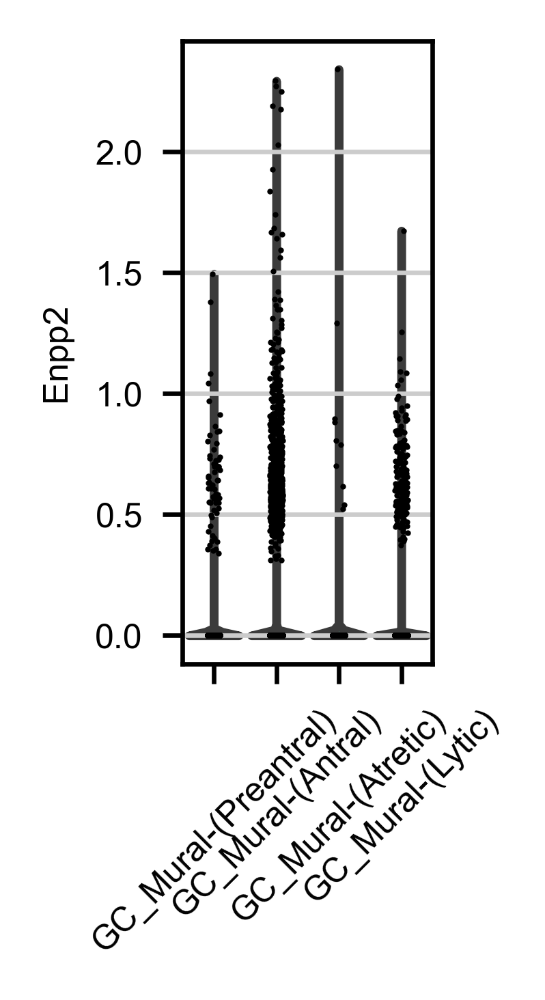

In [46]:
sc.pl.violin(granulosa_combined, keys="Enpp2", 
                 groupby="granulosa_celltypes_reduced",
                 log=False, use_raw=None, 
                 stripplot=True, jitter=True, 
                 size=1, layer=None, scale='width', 
                 order=None, multi_panel=None, xlabel='', 
                 ylabel=None, rotation=45, show=None, save=None, ax=None)

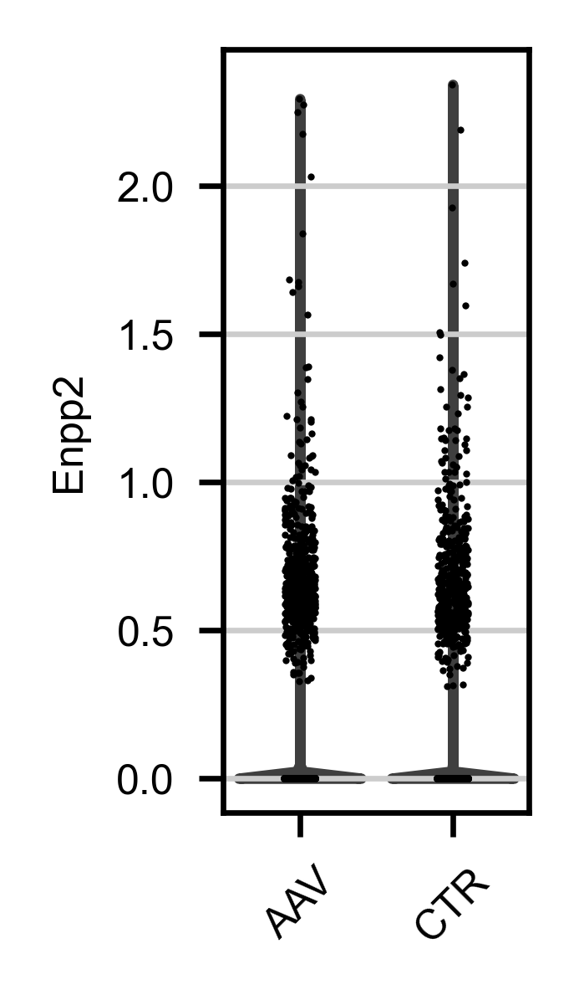

In [50]:
sc.pl.violin(granulosa_combined, keys="Enpp2", 
                 groupby="Sample",
                 log=False, use_raw=None, 
                 stripplot=True, jitter=True, 
                 size=1, layer=None, scale='width', 
                 order=None, multi_panel=None, xlabel='', 
                 ylabel=None, rotation=45, show=None, save=None, ax=None)